# Train the Detectron2 NN using the square coco dataset 




In [1]:
import random
import os
import cv2
import logging
import matplotlib.pyplot as plt
import numpy as np

import torch

from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.engine.hooks import HookBase

from detectron2.utils.visualizer import Visualizer, ColorMode
import detectron2.utils.comm as comm
from detectron2.utils.logger import log_every_n_seconds

from detectron2.config import get_cfg

from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetMapper, build_detection_test_loader
from detectron2.data import transforms as T

from detectron2.evaluation import COCOEvaluator, inference_on_dataset, inference_context





import torch
import time
import datetime


DatasetCatalog.clear()
MetadataCatalog.clear()
torch.cuda.empty_cache()



## Split Dataset

This section is used to customly split a COCO dataset given in one piece. This allows to customly change the Train/Test/Validation split on the data. 

In case we would like to have a validation set, we can first split into Train /Test+Val and then split the second one using the same function. 

From: https://github.com/akarazniewicz/cocosplit/tree/master

In [2]:
import json
#import argparse
import funcy
from sklearn.model_selection import train_test_split
from skmultilearn.model_selection import iterative_train_test_split
import numpy as np




def save_coco(file, info, licenses, images, annotations, categories):
    with open(file, 'wt', encoding='UTF-8') as coco:
        json.dump({ 'info': info, 'licenses': licenses, 'images': images, 
            'annotations': annotations, 'categories': categories}, coco, indent=2, sort_keys=True)

def filter_annotations(annotations, images):
    image_ids = funcy.lmap(lambda i: int(i['id']), images)
    return funcy.lfilter(lambda a: int(a['image_id']) in image_ids, annotations)


def filter_images(images, annotations):

    annotation_ids = funcy.lmap(lambda i: int(i['image_id']), annotations)

    return funcy.lfilter(lambda a: int(a['id']) in annotation_ids, images)

def split_coco_dataset(COCO_ANNOTATIONS, TRAIN_DEST, TEST_DEST, having_annotations, multi_class, SPLIT):
    
    annotation_path = COCO_ANNOTATIONS
    
    with open(annotation_path, 'r') as annotations:
        coco = json.load(annotations)
        info = coco['info']
        licenses = coco['licenses']
        images = coco['images']
        annotations = coco['annotations']
        categories = coco['categories']

        number_of_images = len(images)

        images_with_annotations = funcy.lmap(lambda a: int(a['image_id']), annotations)

        if having_annotations:
            images = funcy.lremove(lambda i: i['id'] not in images_with_annotations, images)


        if multi_class:

            annotation_categories = funcy.lmap(lambda a: int(a['category_id']), annotations)

            #bottle neck 1
            #remove classes that has only one sample, because it can't be split into the training and testing sets
            annotation_categories =  funcy.lremove(lambda i: annotation_categories.count(i) <=1  , annotation_categories)

            annotations =  funcy.lremove(lambda i: i['category_id'] not in annotation_categories  , annotations)


            X_train, y_train, X_test, y_test = iterative_train_test_split(np.array([annotations]).T,np.array([ annotation_categories]).T, test_size = 1-SPLIT)

            save_coco(TRAIN_DEST, info, licenses, filter_images(images, X_train.reshape(-1)), X_train.reshape(-1).tolist(), categories)
            save_coco(TEST_DEST, info, licenses,  filter_images(images, X_test.reshape(-1)), X_test.reshape(-1).tolist(), categories)

            print("Saved {} entries in {} and {} in {}".format(len(X_train), TRAIN_DEST, len(X_test), TEST_DEST))
            
        else:

            X_train, X_test = train_test_split(images, train_size=SPLIT)

            anns_train = filter_annotations(annotations, X_train)
            anns_test=filter_annotations(annotations, X_test)

            save_coco(TRAIN_DEST, info, licenses, X_train, anns_train, categories)
            save_coco(TEST_DEST, info, licenses, X_test, anns_test, categories)

            print("Saved {} entries in {} and {} in {}".format(len(anns_train), TRAIN_DEST, len(anns_test), TEST_DEST))

Split the existing coco annotation into two train and test datasets with 90% of the data in the training set. 

In [3]:
having_annotations = True
multi_class = False
SPLIT = 0.9

#COCO_ANNOTATIONS = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023.json"
#TRAIN_DEST = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_train.json"
#TEST_DEST = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_test.json"

# Original Coco file
COCO_ANNOTATIONS = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/00_Dataset/uFTIR_curated_square.v5-uftir_curated_square_2024-03-14.coco-segmentation/train/_annotations.coco.json"

# Target files
TRAIN_DEST = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/00_Dataset/uFTIR_curated_square.v5-uftir_curated_square_2024-03-14.coco-segmentation/_split/instances_particles_square2024_train.json"
TEST_DEST = "/home/thibault.schowing/workspace/0_DATA/IMPTOX/00_Dataset/uFTIR_curated_square.v5-uftir_curated_square_2024-03-14.coco-segmentation/_split/instances_particles_square2024_test.json"


split_coco_dataset(COCO_ANNOTATIONS, TRAIN_DEST, TEST_DEST, having_annotations, multi_class, SPLIT)

Saved 30369 entries in /home/thibault.schowing/workspace/0_DATA/IMPTOX/00_Dataset/uFTIR_curated_square.v5-uftir_curated_square_2024-03-14.coco-segmentation/_split/instances_particles_square2024_train.json and 3437 in /home/thibault.schowing/workspace/0_DATA/IMPTOX/00_Dataset/uFTIR_curated_square.v5-uftir_curated_square_2024-03-14.coco-segmentation/_split/instances_particles_square2024_test.json


## Register Dataset

Register the coco dataset for training. 

In [4]:



# Register the train, test, and validation datasets
register_coco_instances("train_particles_square", {}, 
                        "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_train.json", 
                        "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/Training_Images/")
register_coco_instances("test_particles_square", {}, 
                        "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_test.json", 
                        "/home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/Training_Images/")


# Define metadata for your classes
MetadataCatalog.get("train_particles_square").set(thing_classes=["particle"])
MetadataCatalog.get("test_particles_square").set(thing_classes=["particle"])


def create_mosaic(dataset_name, max_images=30):
    dataset_dicts = DatasetCatalog.get(dataset_name)
    metadata = MetadataCatalog.get(dataset_name)
    
    num_images = min(len(dataset_dicts), max_images)
    fig, axes = plt.subplots(1, num_images, figsize=(20, 5))
    
    for i, d in enumerate(random.sample(dataset_dicts, num_images)):
        image = plt.imread(d["file_name"])
        v = Visualizer(image, metadata=metadata, scale=0.8)
        v = v.draw_dataset_dict(d)
        axes[i].imshow(v.get_image()[:, :, ::-1])
        axes[i].axis("off")
        axes[i].set_title(f"Image {i+1}")
    
    plt.tight_layout()
    plt.show()


# print the length of the coco datasets: train and test
print(len(DatasetCatalog.get("train_particles_square")))
print(len(DatasetCatalog.get("test_particles_square")))
    


1211
135


In [5]:
#create_mosaic("train_particles_square")

## Data augmentation 

We have to make our own trainer

https://stackoverflow.com/questions/71774744/how-to-use-detectron2s-augmentation-with-datasets-loaded-using-register-coco-in

Check the doc [here](https://detectron2.readthedocs.io/en/latest/tutorials/data_loading.html) for details on data augmentation

Là : https://github.com/TannerGilbert/Object-Detection-and-Image-Segmentation-with-Detectron2/blob/master/Detectron2_Train_on_a_custom_dataset_with_data_augmentation.ipynb 

ici aussi: https://jss367.github.io/data-augmentation-in-detectron2.html#randomflip




## Configure and Train Detectron2

In [6]:
cfg = get_cfg()
cfg.OUTPUT_DIR = "./TrainDetectron2_ModelSquare"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

cfg.merge_from_file(
    "../../Other/detectron2/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    #"../../Other/detectron2/configs/Misc/cascade_mask_rcnn_R_50_FPN_3x.yaml"
) # Detectron2 accidentally installed at more than one place

# Specify the train, test, and validation subsets in your Detectron2 configuration
cfg.DATASETS.TRAIN = ("train_particles_square",)
cfg.DATASETS.TEST = ("test_particles_square",)  # Possible to later change the test set
#cfg.DATASETS.VAL = ("val_...",) # You can add validation dataset here if you want to evaluate during training
cfg.DATALOADER.NUM_WORKERS = 4

cfg.TEST.EVAL_PERIOD = 50

# Before training
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.MODEL.DEVICE = 'cuda:1'  # cpu or cuda:0-1
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = (
    4000
)  # 300 iterations seems good enough, but you can certainly train longer
# MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (128) # faster, and good enough for this small dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    128
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 1 class: particle



In [7]:


#from detectron2.data import build_detection_train_loader, DatasetMapper
#from detectron2.engine import DefaultTrainer
#from detectron2.data import transforms as T


#class MyTrainer(DefaultTrainer):

#    @classmethod
#    def build_train_loader(cls, cfg):
#        augmentations = [
#            T.Resize((256, 256)),
#            #T.RandomBrightness(0.8, 1.2),
#            #T.RandomContrast(0.8, 1.2),
#            #T.RandomSaturation(0.5, 1.2),
#            #T.RandomRotation(angle=[-10, 10], expand=False),
#            T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
#            T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
#        ]
        
#        mapper = DatasetMapper(cfg, is_train=True, augmentations=augmentations)
#        return build_detection_train_loader(cfg, mapper=mapper)
    
#trainer = MyTrainer(cfg);
#trainer.resume_or_load(resume=False);
#trainer.train();



In [8]:
# Evaluation Hook

class LossEvalHook(HookBase):
    def __init__(self, eval_period, model, data_loader):
        self._model = model
        self._period = eval_period
        self._data_loader = data_loader
    
    def _do_loss_eval(self):
        # Copying inference_on_dataset from evaluator.py
        total = len(self._data_loader)
        num_warmup = min(5, total - 1)
            
        start_time = time.perf_counter()
        total_compute_time = 0
        losses = []
        for idx, inputs in enumerate(self._data_loader):            
            if idx == num_warmup:
                start_time = time.perf_counter()
                total_compute_time = 0
            start_compute_time = time.perf_counter()
            if torch.cuda.is_available():
                torch.cuda.synchronize()
            total_compute_time += time.perf_counter() - start_compute_time
            iters_after_start = idx + 1 - num_warmup * int(idx >= num_warmup)
            seconds_per_img = total_compute_time / iters_after_start
            if idx >= num_warmup * 2 or seconds_per_img > 5:
                total_seconds_per_img = (time.perf_counter() - start_time) / iters_after_start
                eta = datetime.timedelta(seconds=int(total_seconds_per_img * (total - idx - 1)))
                log_every_n_seconds(
                    logging.INFO,
                    "Loss on Validation  done {}/{}. {:.4f} s / img. ETA={}".format(
                        idx + 1, total, seconds_per_img, str(eta)
                    ),
                    n=5,
                )
            loss_batch = self._get_loss(inputs)
            losses.append(loss_batch)
        mean_loss = np.mean(losses)
        self.trainer.storage.put_scalar('validation_loss', mean_loss)
        comm.synchronize()

        return losses
            
    def _get_loss(self, data):
        # How loss is calculated on train_loop 
        metrics_dict = self._model(data)
        metrics_dict = {
            k: v.detach().cpu().item() if isinstance(v, torch.Tensor) else float(v)
            for k, v in metrics_dict.items()
        }
        total_losses_reduced = sum(loss for loss in metrics_dict.values())
        return total_losses_reduced
        
        
    def after_step(self):
        next_iter = self.trainer.iter + 1
        is_final = next_iter == self.trainer.max_iter
        if is_final or (self._period > 0 and next_iter % self._period == 0):
            self._do_loss_eval()
        #self.trainer.storage.put_scalars(timetest=12)

In [9]:
from detectron2.data import build_detection_train_loader, DatasetMapper


class MyTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        augmentations = [
            T.Resize((256, 256)),
            #T.RandomBrightness(0.8, 1.2),
            #T.RandomContrast(0.8, 1.2),
            #T.RandomSaturation(0.5, 1.2),
            #T.RandomRotation(angle=[-10, 10], expand=False),
            T.RandomFlip(prob=0.5, horizontal=True, vertical=False),
            T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
        ]
        
        mapper = DatasetMapper(cfg, is_train=True, augmentations=augmentations)
        return build_detection_train_loader(cfg, mapper=mapper)

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = os.path.join(cfg.OUTPUT_DIR, "inference")
        return COCOEvaluator(dataset_name, cfg, True, output_folder)
                     
    def build_hooks(self):
        hooks = super().build_hooks()
        hooks.insert(-1,LossEvalHook(
            cfg.TEST.EVAL_PERIOD,
            self.model,
            build_detection_test_loader(
                self.cfg,
                self.cfg.DATASETS.TEST[0],
                DatasetMapper(self.cfg,True)
            )
        ))
        return hooks    



In [10]:
#
# Perform the training
#



trainer = MyTrainer(cfg);
trainer.resume_or_load(resume=False);
trainer.train();

[03/19 10:10:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in

[03/19 10:10:50 d2.engine.train_loop]: Starting training from iteration 0


/home/thibault.schowing/data-local/miniconda3/envs/aienv/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/19 10:11:04 d2.utils.events]:  eta: 0:41:36  iter: 19  total_loss: 8.268  loss_cls: 0.5802  loss_box_reg: 0.5886  loss_mask: 0.692  loss_rpn_cls: 5.293  loss_rpn_loc: 0.9986    time: 0.6293  last_time: 0.6467  data_time: 0.1443  last_data_time: 0.1739   lr: 3.9962e-05  max_mem: 0M


2024-03-19 10:11:04.920703: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-19 10:11:05.939556: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


[03/19 10:11:19 d2.utils.events]:  eta: 0:41:40  iter: 39  total_loss: 3.164  loss_cls: 0.4989  loss_box_reg: 0.5526  loss_mask: 0.685  loss_rpn_cls: 0.6439  loss_rpn_loc: 0.7342    time: 0.6291  last_time: 0.6458  data_time: 0.1096  last_data_time: 0.1326   lr: 7.9922e-05  max_mem: 0M
[03/19 10:11:25 d2.data.datasets.coco]: Loaded 135 images in COCO format from /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_test.json
[03/19 10:11:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/19 10:11:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/19 10:11:25 d2.data.common]: Serializing 135 elements to byte tensors and concatenating them all ...
[03/19 10:11:25 d2.data.common]: Serialized dataset takes 0.63 MiB
WARNING [03/19 10:11:25 d2.evaluation.co

In [11]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6   # set the testing threshold for this model
cfg.TEST.DETECTIONS_PER_IMAGE = 2000
predictor = DefaultPredictor(cfg)

[03/19 11:25:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./TrainDetectron2_ModelSquare/model_final.pth ...


In [12]:
# Load the evaluation dataset - 
val_dataset_name = "test_particles_square"
val_dataset_dicts = DatasetCatalog.get(val_dataset_name)

# Prepare a table for plotting
predictions = []
ground_truths = []
for d in val_dataset_dicts:
    image_path = d["file_name"]
    image = cv2.imread(image_path)
    outputs = predictor(image)

    instances = outputs["instances"].to("cpu")
    predictions.append(instances)
    ground_truths.append(d)  # Append the whole dictionary, containing "file_name" and "annotations"

    
evaluator = COCOEvaluator(val_dataset_name, cfg, False, output_dir=cfg.OUTPUT_DIR)
val_loader = build_detection_test_loader(cfg, val_dataset_name)

# Perform evaluation using the predictor and evaluator
metrics = inference_on_dataset(predictor.model, val_loader, evaluator)

print(metrics)

[03/19 11:25:37 d2.data.datasets.coco]: Loaded 135 images in COCO format from /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_test.json
WARNING [03/19 11:25:48 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[03/19 11:25:48 d2.data.datasets.coco]: Loaded 135 images in COCO format from /home/thibault.schowing/workspace/0_DATA/IMPTOX/06-tensorflow/data/uFTIR_square_coco/instances_particles_square2023_test.json
[03/19 11:25:48 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/19 11:25:48 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[03/19 11:25:48 d2.data.common]: Serializing 135 elements to byte tensors and concatenating them all ...
[03/19 11:25:48 d2.d

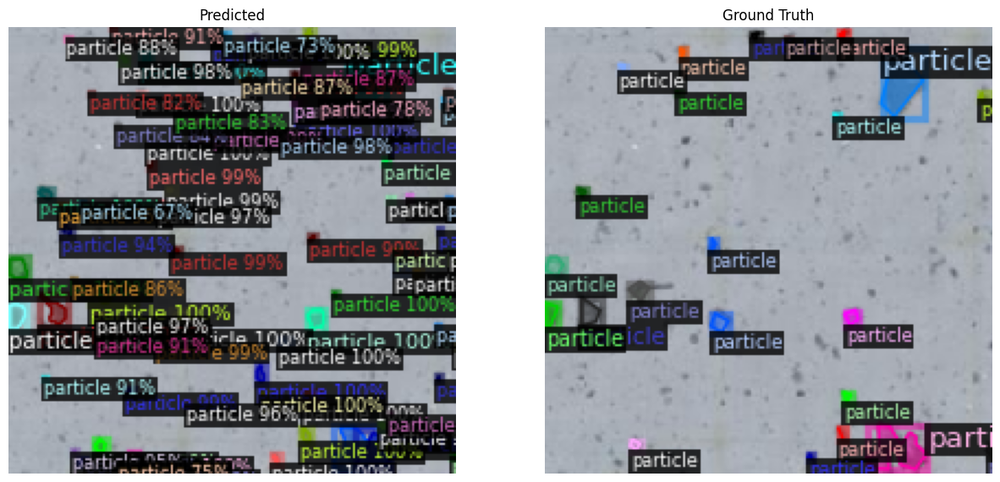

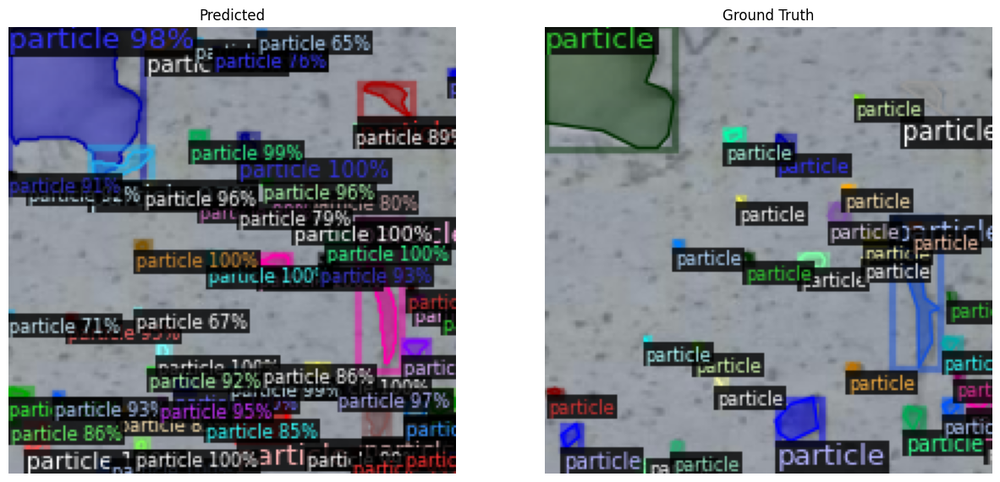

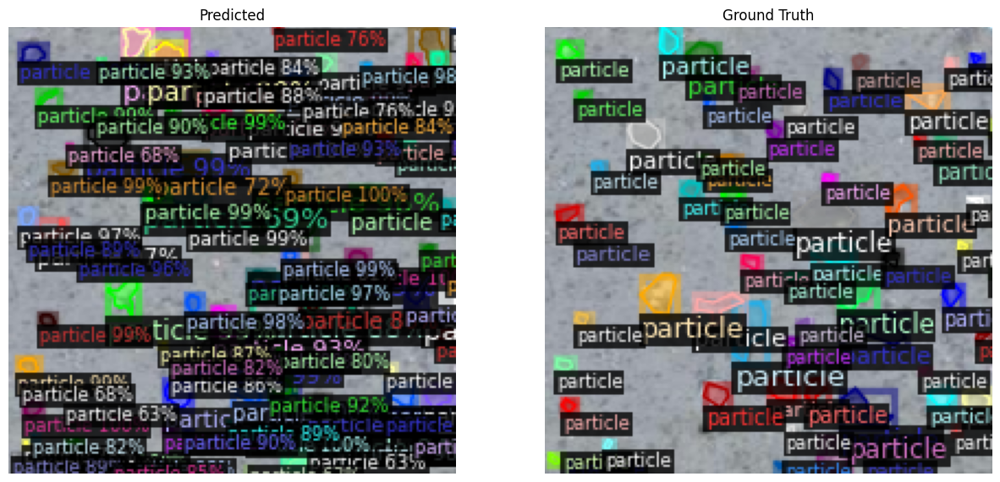

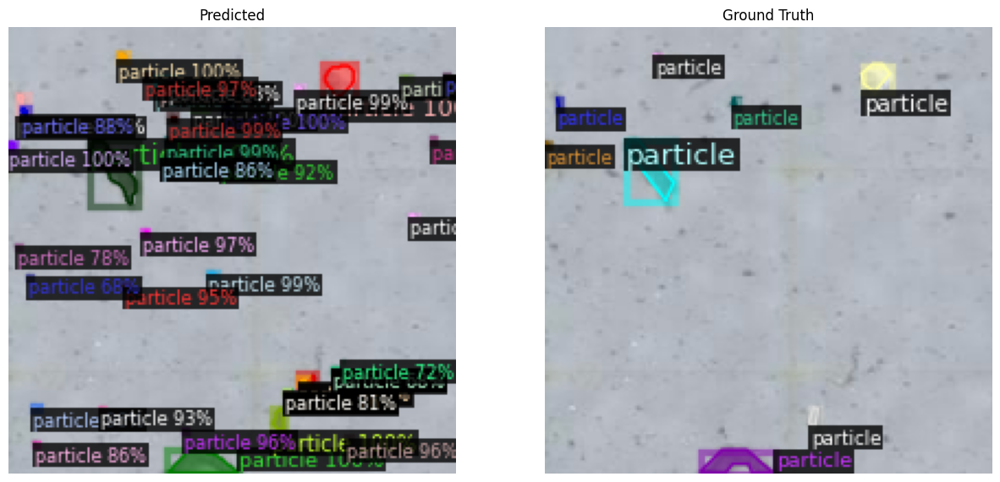

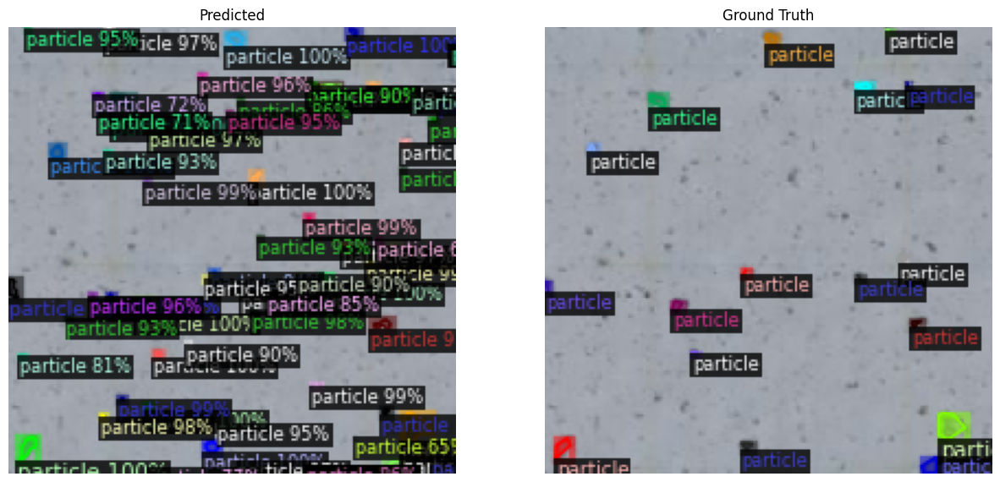

...

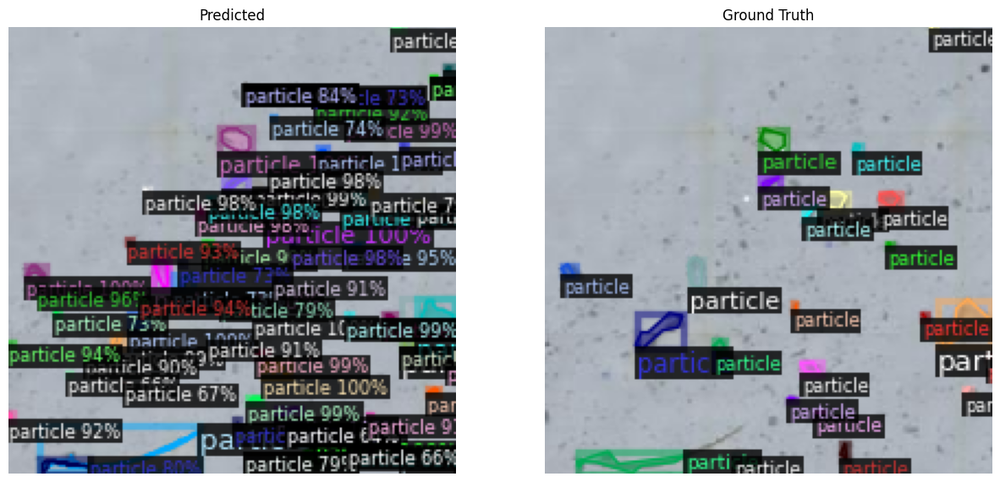

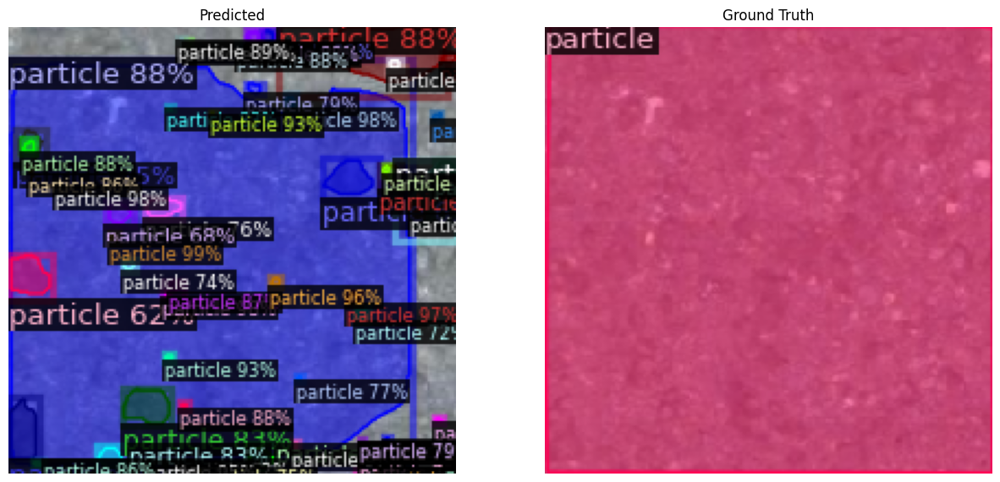

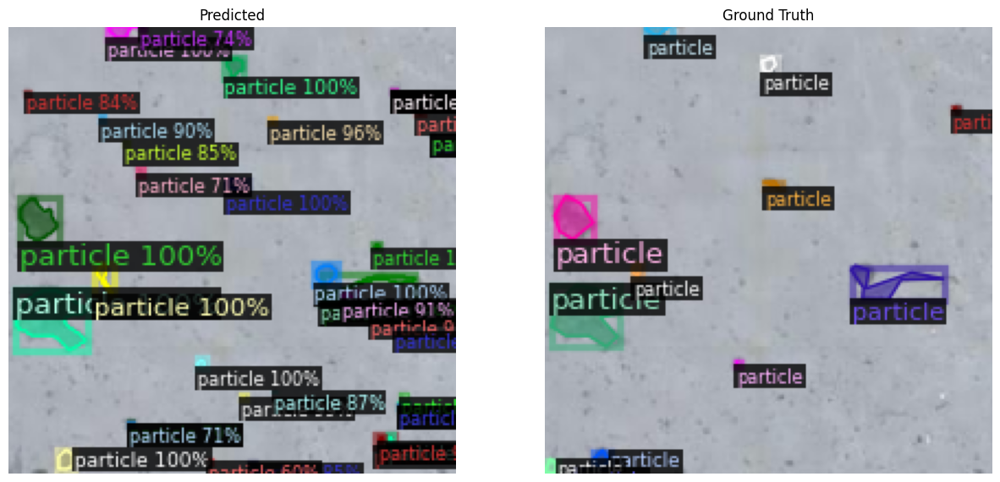

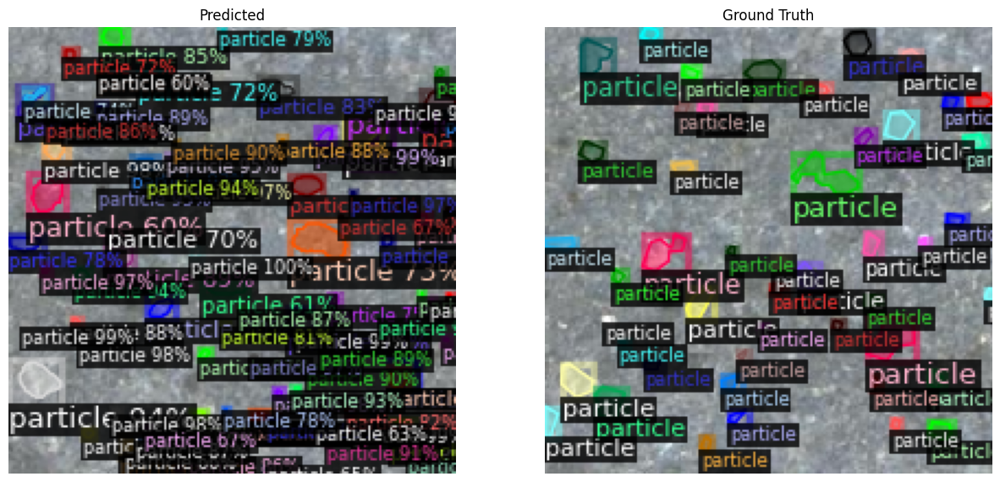

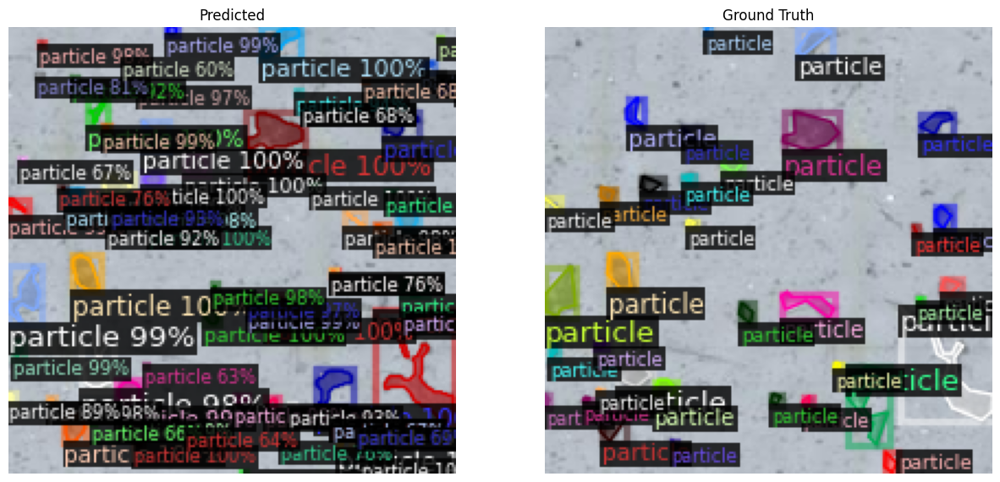

In [13]:
# Step 5: Plot a few graphics to compare predictions with ground truth

for i in range(20):
    image_path = ground_truths[i]["file_name"]
    image = cv2.imread(image_path)

    v_pred = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get(val_dataset_name), scale=0.8)
    v_pred = v_pred.draw_instance_predictions(predictions[i])

    v_gt = Visualizer(image[:, :, ::-1], metadata=MetadataCatalog.get(val_dataset_name), scale=0.8)
    v_gt = v_gt.draw_dataset_dict(ground_truths[i])

    # Plot the predicted and ground truth instances side by side
    plt.figure(figsize=(15, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(v_pred.get_image()[:, :, ::-1])
    plt.title("Predicted")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(v_gt.get_image()[:, :, ::-1])
    plt.title("Ground Truth")
    plt.axis("off")

    plt.show()

Loss plot

In [14]:
experiment_folder = cfg.OUTPUT_DIR 

def load_json_arr(json_path):
    lines = []
    with open(json_path, 'r') as f:
        for line in f:
            lines.append(json.loads(line))
    return lines

experiment_metrics = load_json_arr(experiment_folder + '/metrics.json')

print(experiment_metrics)

[{'data_time': 0.12786909652641043, 'eta_seconds': 227.88839342887513, 'fast_rcnn/cls_accuracy': 0.7724609375, 'fast_rcnn/false_negative': 0.9892691508812652, 'fast_rcnn/fg_cls_accuracy': 0.010730849118734773, 'iteration': 19, 'loss_box_reg': 0.5441703796386719, 'loss_cls': 0.5442893505096436, 'loss_mask': 0.6900127530097961, 'loss_rpn_cls': 2.979952812194824, 'loss_rpn_loc': 0.955735445022583, 'lr': 9.690500000000001e-05, 'mask_rcnn/accuracy': 0.6847716754146371, 'mask_rcnn/false_negative': 0.07616288788171886, 'mask_rcnn/false_positive': 0.48933369434697455, 'roi_head/num_bg_samples': 98.5625, 'roi_head/num_fg_samples': 29.4375, 'rpn/num_neg_anchors': 130.96875, 'rpn/num_pos_anchors': 125.03125, 'time': 0.5997062984970398, 'total_loss': 5.703255206346512}, {'data_time': 0.1336477494915016, 'eta_seconds': 222.54008184419945, 'fast_rcnn/cls_accuracy': 0.76806640625, 'fast_rcnn/false_negative': 1.0, 'fast_rcnn/fg_cls_accuracy': 0.0, 'iteration': 39, 'loss_box_reg': 0.5255100727081299, '

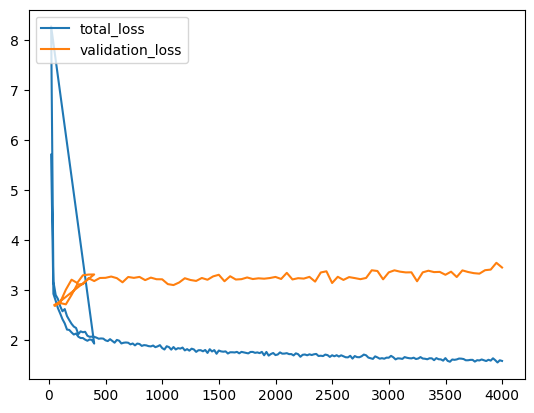

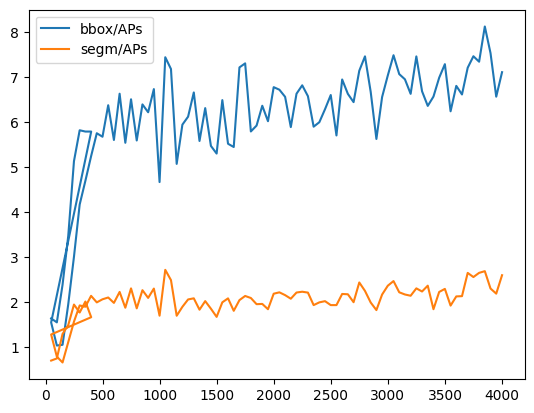

In [15]:
import json
import matplotlib.pyplot as plt




#and 'eta_seconds' in x and x['eta_seconds'] == 0.0


plt.plot(
    [x['iteration'] for x in experiment_metrics if 'total_loss' in x], 
    [x['total_loss'] for x in experiment_metrics if 'total_loss' in x])
plt.plot(
    [x['iteration'] for x in experiment_metrics if 'validation_loss' in x], 
    [x['validation_loss'] for x in experiment_metrics if 'validation_loss' in x])
plt.legend(['total_loss', 'validation_loss'], loc='upper left')
plt.show()



plt.plot([x['iteration'] for x in experiment_metrics if 'bbox/APs' in x], 
         [x['bbox/APs'] for x in experiment_metrics if 'bbox/APs' in x])
plt.plot([x['iteration'] for x in experiment_metrics if 'segm/APs' in x], 
         [x['segm/APs'] for x in experiment_metrics if 'segm/APs' in x])
plt.legend(['bbox/APs', 'segm/APs'], loc='upper left')
plt.show()

In [16]:
[x['segm/APs'] for x in experiment_metrics if 'segm/APs' in x]


[0.6944028225881834,
 0.7421689195618727,
 1.2870802774651187,
 1.4843553120270663,
 1.939890003833812,
 1.7635848991626086,
 2.0066705126419717,
 1.6590288032831375,
 1.2746838063520947,
 0.7820241179643118,
 0.6522905377373889,
 1.105729704285377,
 1.5599157204478376,
 1.9203131776268483,
 1.891720979180758,
 2.1334879090442547,
 1.9883768333256107,
 2.057161787534246,
 2.096950731774712,
 1.9768299661287878,
 2.220998523802109,
 1.8699892261740676,
 2.2994546665865596,
 1.8557062884440312,
 2.2597002380341733,
 2.088259254234109,
 2.2952820067932547,
 1.6929846360205028,
 2.711854550517709,
 2.4830750256191596,
 1.6914904812469502,
 1.889493251162048,
 2.0537183457204184,
 2.078352626712756,
 1.8259723571865738,
 2.0165740020072906,
 1.847906279621853,
 1.6660793927758877,
 1.989668104521438,
 2.077780089999337,
 1.8009507364302746,
 2.0388719115346365,
 2.131128434925433,
 2.0855636604351093,
 1.948484231725156,
 1.954076055034537,
 1.8363268130950021,
 2.1810726141814833,
 2.21173

In [17]:
[x['iteration'] for x in experiment_metrics if 'segm/APs' in x]

[49,
 99,
 149,
 199,
 249,
 299,
 349,
 400,
 49,
 99,
 149,
 199,
 249,
 299,
 349,
 399,
 449,
 499,
 549,
 599,
 649,
 699,
 749,
 799,
 849,
 899,
 949,
 999,
 1049,
 1099,
 1149,
 1199,
 1249,
 1299,
 1349,
 1399,
 1449,
 1499,
 1549,
 1599,
 1649,
 1699,
 1749,
 1799,
 1849,
 1899,
 1949,
 1999,
 2049,
 2099,
 2149,
 2199,
 2249,
 2299,
 2349,
 2399,
 2449,
 2499,
 2549,
 2599,
 2649,
 2699,
 2749,
 2799,
 2849,
 2899,
 2949,
 2999,
 3049,
 3099,
 3149,
 3199,
 3249,
 3299,
 3349,
 3399,
 3449,
 3499,
 3549,
 3599,
 3649,
 3699,
 3749,
 3799,
 3849,
 3899,
 3949,
 4000]